# Lab 2 - Feature Generation, Feature Extraction & Feature Selection

This is a project group assignment.

**Due: Monday, February 24, 11:59 PM**

## Grading Rubric

1. **Problem 1 (20 pts)**
    * **Additional training (0 pts):** If you decide to use more training samples, you can include them in this lab.
    
    * **Training data discussion (20 pts):** your discussion includes all the listed topics.
    
2. **Problem 2 (30 pts)** 
    * **Image transformation (15 pts):** you've transformed the training data, discussed advantages/disadvantages on the transformation and displayed a few samples.
    
    * **Image normalization (15 pts):** you've normalized the training data, discussed advantages/disadvantages on the normalization and displayed a few samples.

3. **Problem 3 (50 pts)**
    * **Feature Generators (20 pts):** you've generated features using PCA and HOG.
    
    * **Cluster-validity metrics (20 pts):** you've implemented the quality metrics for each feature descriptor.

    * **Feature Discussion (10 pts):** you've provided a discussion about feature quality. This discussion should use your plotting schemes and the results from quality metrics.
    
**Total: 100 pts**

# Feature Extraction & Feature Selection

The objective of Lab 2 is to introduce to the importance of pre-processing, normalization, feature generation, feature extraction and feature selection. You will develop, implement and compare several pre-processing pipelines on the collected project data sets. You will also implement feature visualization scripts and cluster validity-type metrics to aid in your pre-processing evaluation and visualization.

**You can use ```scikit-learn``` modules.**

**Objectives**

By completing this assignment you will practice and master the following skills:

* Image pre-processing for object classification
* Different types of normalization
* Feature Generation for image analysis
* Feature Extraction & Feature Selection
* Visualization and quality assessment of features

**Create your Repo**

You can create the repo for this assignment by visiting the following link: https://classroom.github.com/g/eQXPcRix

# Training Data Set

The training data set was collected from the entire class of EEL 4930. The training set contains 1844 samples of $100\times 100$ RGB images. 
* You can download both the training data set (**"train_data.npy"**) and training labels (**"train_labels.npy"**) from our Canvas page [here](https://ufl.instructure.com/courses/395133/files/folder/Project%20Data).

The test data set will not be available until the end of the semester. It will have the same format as the training set.

Let's plot some sample images:

In [1]:
import numpy as np
import random
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
Xtrain = np.load('train_data.npy')
ytrain = np.load('train_labels.npy')

Xtrain.shape, ytrain.shape

((1844, 100, 100, 3), (1844, 1))

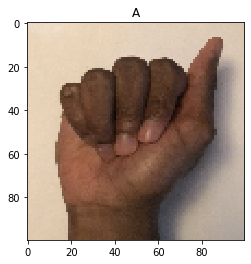

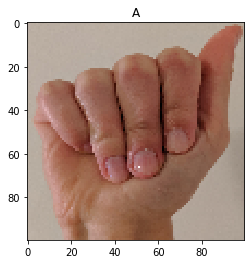

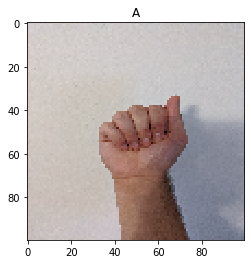

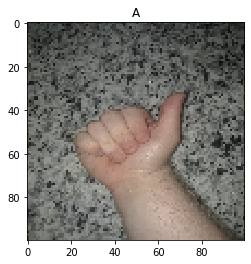

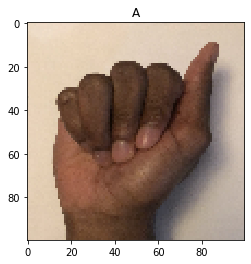

...

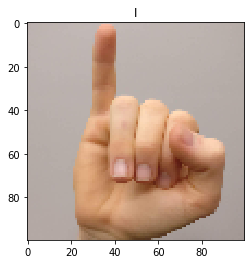

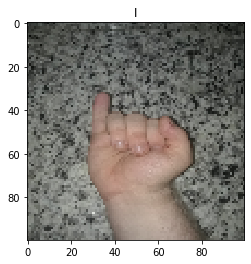

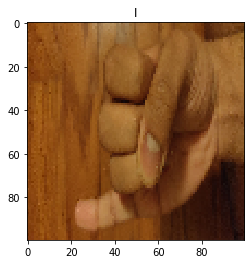

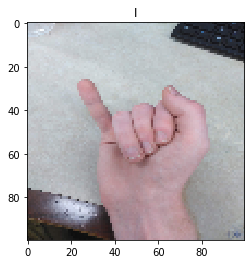

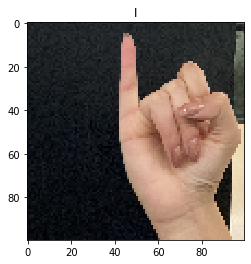

In [3]:
# Displaying a few Training Samples
labels = ['A','B','C','D','E','F','G','H','I']

for j in range(len(labels)):
    idx = list(np.where(ytrain == labels[j])[0])
    random.shuffle(idx)
    # Only displaying 10 random samples for each character
    for k in range(10):
        plt.imshow(Xtrain[idx[k],:,:,:]);
        plt.title(ytrain[idx[k]][0])
        plt.show();

# Problem 1

Provide a discussion about the quality of the training data set. Your discussion should include: 

1. Number of training samples per class
2. Dimensionality of feature space
3. Class representation (whether there is more than one dominant signing hand, alignment of signing hand, background, etc.)

This discussion may also include any *data impressions* that you may want to test in some other stage of your ML pipeline.

### 1. Number of training samples per class

In [4]:
alpha=['A','B','C','D','E','F','G','H','I']
for i in range(9):
    print("Number of training samples in class " + alpha[i] + ": " + str(np.sum(ytrain==alpha[i])))

Number of training samples in class A: 204
Number of training samples in class B: 205
Number of training samples in class C: 205
Number of training samples in class D: 205
Number of training samples in class E: 205
Number of training samples in class F: 205
Number of training samples in class G: 205
Number of training samples in class H: 205
Number of training samples in class I: 205


The spread of samples per class is very even with an exception for class A having 1 less than the rest.

### 2. Dimensionality of feature space

The dimensionality of the space is 100x100x3, the number of pixels times the rgb value.

### 3. Class representation (whether there is more than one dominant signing hand, alignment of signing hand, background, etc.)

Some of the hands are different colors, as there are different shades of white and dark shades as well. The backgrounds are also different, as some have black backgrounds, others wood brown, others gray, some in front of a t-shirt. Some show just the hand and others have forearms in them, thus not all are centered. Also, for the letter "B" for example, some hands have the fingers together whereas others have spaces between them. Some images also have 90 degree rotation to them. These issues may cause the model to misfit. 

# Problem 2

In this problem, you will implement different pre-processing and normalization techniques for the training data. They should include:

1. Transformation of RGB channels to grayscale channel. You may use the function ```rgb2gray``` from ```skimage.color```.
2. RGB color channels normalization.

For each normalization technique, you should: (1) plot a few samples, and (2) discuss the advantages of each normalization technique versus others. You should also discuss the importance of data normalization in general.

For subsequent problems, you should choose a normalization technique or (preferred) compare performance among normalization techniques.

### 1. Transformation of RGB channels to grayscale channel. You may use the function rgb2gray from skimage.color.

In [5]:
from skimage.color import rgb2gray
x_train_gray = rgb2gray(Xtrain)
x_train_gray.shape

(1844, 100, 100)

In [6]:
# Display grayscale pictures
def plot_pics(data_to_plot):
    labels = ['A','B','C','D','E','F','G','H','I']

    for j in range(len(labels)):
        idx = list(np.where(ytrain == labels[j])[0])
        random.shuffle(idx)
        # Only displaying 10 random samples for each character
        for k in range(10):
            plt.imshow(data_to_plot[idx[k],:,:], cmap=plt.cm.gray);
            plt.title(ytrain[idx[k]][0])
            plt.show();

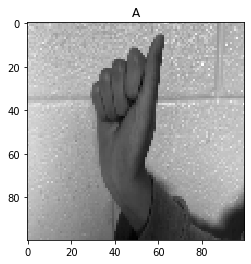

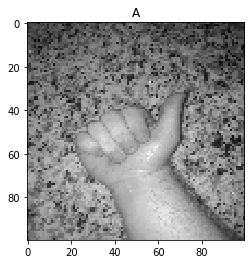

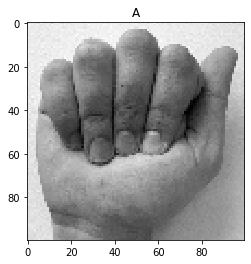

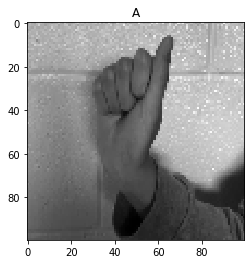

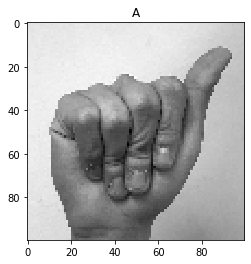

...

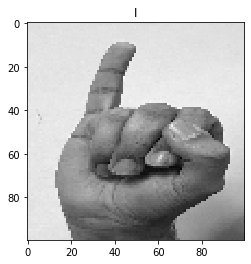

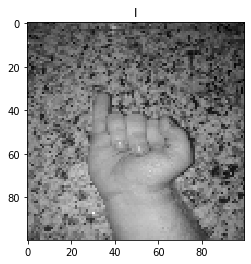

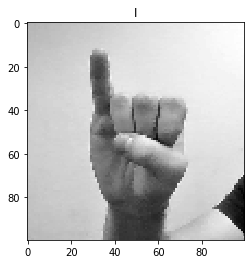

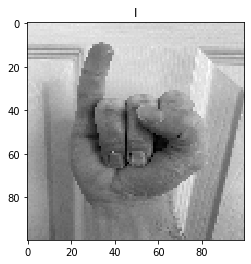

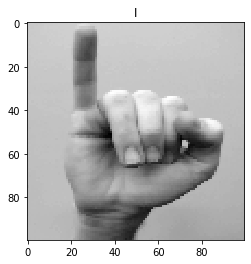

In [7]:
plot_pics(x_train_gray)

### 2. RGB color channels normalization.

In [8]:
x_train_gray = x_train_gray.flatten().reshape(1844, 10000)

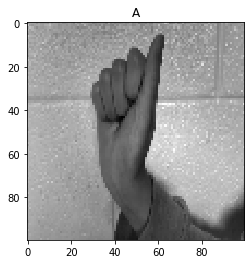

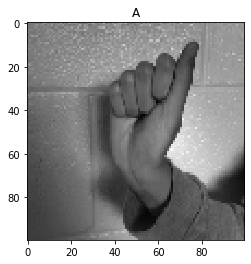

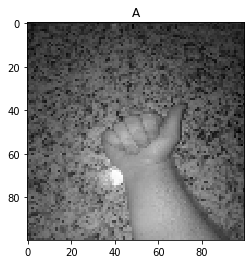

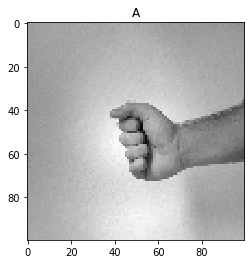

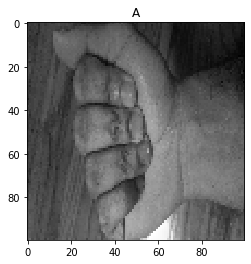

...

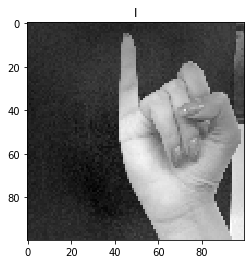

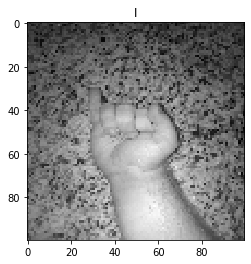

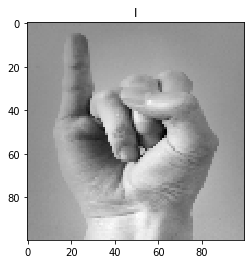

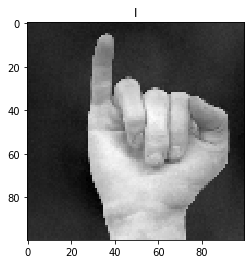

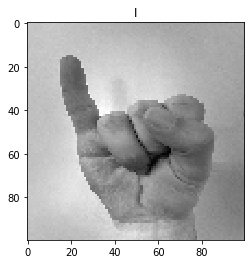

In [9]:
from sklearn.preprocessing import StandardScaler 
sc = StandardScaler()
x_train_stdz_gs = sc.fit_transform(x_train_gray)
x_train_stdz_gs_image = x_train_stdz_gs.flatten().reshape(1844, 100, 100)
plot_pics(x_train_stdz_gs_image)

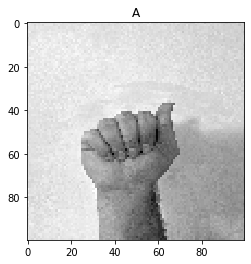

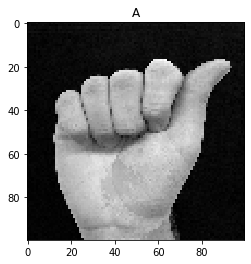

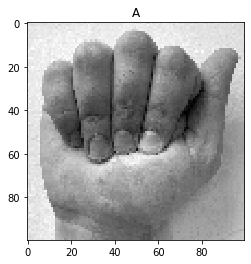

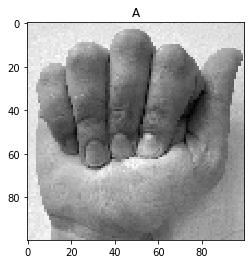

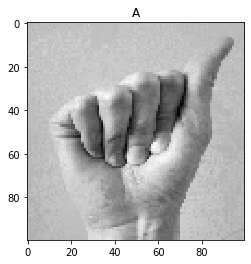

...

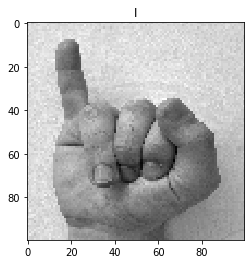

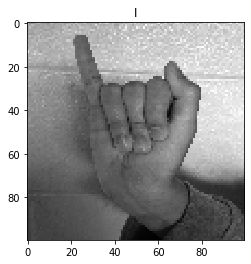

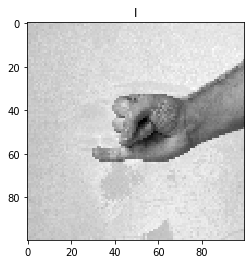

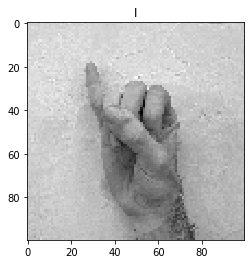

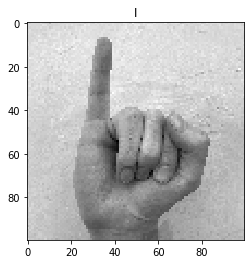

In [10]:
from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()
x_train_norm_gs = mms.fit_transform(x_train_gray)
x_train_norm_gs_image = x_train_norm_gs.flatten().reshape(1844, 100, 100)
plot_pics(x_train_norm_gs_image)

MinMax Normalization converts the data between 0 and 1 which makes it convenient that all data are in the same positive value range. However, information about outliers are lost. Standardization on the other hand retains outliers as it encodes information using the variance. However, the data ranges in both positive and negative values where some values can be much larger than others. 

Data normalization is critical in general. The three rules of machine learning are normalization, normalization, normalization. If there isn't normalization, then some features that span across a small range from 0 to 1 such as some ratio will have much less impact in a model that also includes another feature that ranges over a much larger set of values, such as temperature or salary. Normalization gives each feature equal importance.

# Problem 3

In this problem, you will generate features from the training set and assess the quality of the generated features by computing a set of cluster validity-type metrics.

You can experiment with several feature generators, but they should include:

1. PCA features on the original training set. **Provide a justification for the number of principal components you will choose.**

2. HOG features on the original training set. **Are HOG features sensitive to object orientation? Why?**

The *ideal* feature space will have class clusters far away from each other and compact class clusters. Compute the following metrics:

1. **Calinski-Harabasz Index**: The index is the ratio of the sum of between-clusters dispersion and of inter-cluster dispersion for all clusters (where dispersion is defined as the sum of distances squared). You may use the function ```calinski_harabasz_score``` from ```sklearn.metrics```.

2. **Davies-Bouldin Index**: This index computes the average similarity between clusters, where the similarity is a measure that compares the distance between clusters with the size of the clusters themselves. You may use the function ```davies_bouldin_score``` from ```sklearn.metrics```.

3. **Silhouette Index**: The silhouette index measures how well class group cluster together it estimates the average distance between clusters. You may use the function ```silhouette_score``` from ```sklearn.metrics```. 

4. **Pairwise Euclidean Distance**: The pairwise Euclidean distance measures how far away class mean are from each other. You may use the function ```pairwise_distances``` from ```sklearn.metrics```.

Include feature visualization by using histograms or heatmap (from ```seaborn```) plots.

Provide a discussion for your findings and remember to always justification your answers.

### 1. PCA features on the original training set. Provide a justification for the number of principal components you will choose.

In [11]:
from sklearn.decomposition import PCA

In [12]:
# standardization
pca_stdz = PCA(0.90).fit(x_train_stdz_gs)
# normalization
pca_norm = PCA(0.90).fit(x_train_norm_gs)

In [13]:
print('Standardization:', pca_stdz.n_components_, 'principal components are needed to explain 90% of the data')
print('Normalization:', pca_norm.n_components_, 'principal components are needed to explain 90% of the data')

Standardization: 84 principal components are needed to explain 90% of the data
Normalization: 73 principal components are needed to explain 90% of the data


We would use 84 principal components if using standardization as that explains 90% of the data. We would use 73 principal components if using normalization as that explains 90% of the data

### 2. HOG features on the original training set. Are HOG features sensitive to object orientation? Why?

In [14]:
from skimage.feature import hog
N_orientations = 4      # Number of directional gradients to compute
Cell_Size = (5, 5)  # Size of window to compute gradient 
NBlocks = (1,1)         # Number of blocks

x_train_gray_image = x_train_gray.flatten().reshape(1844, 100, 100)

In [15]:
# create list of hog for every sample
hog_gradients = [0]*1844
hog_visuals = [0]*1844

size = 1844
for i in range(size):
    hog_gradients[i], hog_visuals[i] = hog(x_train_gray_image[i], orientations=N_orientations, pixels_per_cell=Cell_Size, cells_per_block=NBlocks,visualize=True)

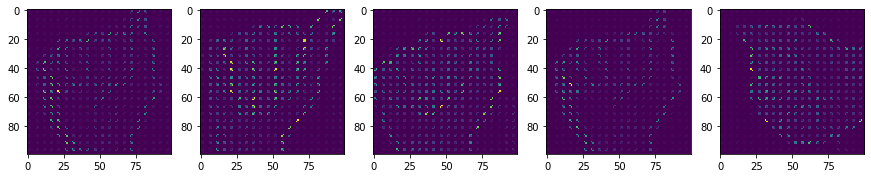

In [16]:
fig, a = plt.subplots(nrows=1, ncols=5, figsize=(15,5))
for i in range(5):
    a[i].imshow(hog_visuals[i])

Yes HOG features are sensitive to object orientation. If an image is rotated 90 degress from the original, the resultant gradients will differ by 90 degrees as well. 

### 3. Silhouette Index: The silhouette index measures how well class group cluster together it estimates the average distance between clusters. You may use the function silhouette_score from sklearn.metrics.

In [17]:
from sklearn.metrics import silhouette_score

In [18]:
# just for fun (to see how LDA would perform)
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
lda = LDA()
lda.fit(x_train_stdz_gs, ytrain.flatten())
name = lda.transform(x_train_stdz_gs)
sil_score = silhouette_score(name, ytrain.flatten())
sil_score

C:\Users\Aaron\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")


0.5337390294758264

In [19]:
# actual silhouette score on original data
sil_score = silhouette_score(x_train_stdz_gs, ytrain.flatten())
sil_score

-0.01729526388041588

This is a low silhouette score since higher scores are preferable. This measures the difference between a point's mean distance to its class and its mean distance to its closest cluster. The larger the number, the more separable the classes are. The value is near zero meaning that there's lots of overlap among classes. The fact that it's negative means that some samples were assigned to the wrong classification. This is likely caused by the data samples such as a "C" that was flipped 90 degrees.

### 4. Pairwise Euclidean Distance: The pairwise Euclidean distance measures how far away class mean are from each other. You may use the function pairwise_distances from sklearn.metrics.

In [20]:
from sklearn.metrics import pairwise_distances

In [21]:
dist = pairwise_distances(x_train_gray)
dist

array([[ 0.        , 14.51237552, 17.12341238, ..., 20.9423954 ,
        20.65645137, 21.24670743],
       [14.51237552,  0.        , 17.33217695, ..., 22.64816271,
        22.33228231, 23.10221866],
       [17.12341238, 17.33217695,  0.        , ..., 22.6499783 ,
        22.47062562, 23.17160885],
       ...,
       [20.9423954 , 22.64816271, 22.6499783 , ...,  0.        ,
         3.95518638,  8.28933871],
       [20.65645137, 22.33228231, 22.47062562, ...,  3.95518638,
         0.        ,  9.12277403],
       [21.24670743, 23.10221866, 23.17160885, ...,  8.28933871,
         9.12277403,  0.        ]])

This function returns a distance matrix, which calculates the distances between each class mean to each other. For different classes, we want this number to be large so that there is more ease in class separability. As evidenced, these distances are moderately large, averaging around 20, with some values at 14 and 17. Some distances have values of 3 which will make it difficult for the model to distinguish classes. 

In [22]:
dist = pairwise_distances(x_train_stdz_gs)
dist

array([[  0.        ,  71.56326349,  80.70413373, ...,  97.56942789,
         96.08805139, 100.12574238],
       [ 71.56326349,   0.        ,  83.1851534 , ..., 105.20983275,
        103.7817167 , 108.13408698],
       [ 80.70413373,  83.1851534 ,   0.        , ..., 108.33557335,
        107.39606909, 111.60976207],
       ...,
       [ 97.56942789, 105.20983275, 108.33557335, ...,   0.        ,
         18.77896077,  40.229012  ],
       [ 96.08805139, 103.7817167 , 107.39606909, ...,  18.77896077,
          0.        ,  43.97247339],
       [100.12574238, 108.13408698, 111.60976207, ...,  40.229012  ,
         43.97247339,   0.        ]])

With the standardized data, the distance function shows much higher distances over 100. Some of the lower values were around 18. The higher values mean distinguish classes is easier than using the un-normalized data.

### 1. Calinski-Harabasz Index: The index is the ratio of the sum of between-clusters dispersion and of inter-cluster dispersion for all clusters (where dispersion is defined as the sum of distances squared). You may use the function calinski_harabasz_score from sklearn.metrics.

In [23]:
from sklearn.metrics import calinski_harabasz_score

In [24]:
cbscore = calinski_harabasz_score(x_train_stdz_gs, ytrain.flatten())
cbscore

7.659897242834243

In an ideal situation, you would have the same number of clusters as classes, which would imply that the data is not overlapping. Our dataset has 9 classes and the index is roughly 7. This shows that there is some overlapping but not much, which makes the model decent in distinguishing classes. 

### 2. **Davies-Bouldin Index**: This index computes the average similarity between clusters, where the similarity is a measure that compares the distance between clusters with the size of the clusters themselves. You may use the function davies_bouldin_score from sklearn.metrics.

In [25]:
from sklearn.metrics import davies_bouldin_score

In [26]:
dbscore = davies_bouldin_score(x_train_stdz_gs, ytrain.flatten())
dbscore

11.140916371910517

The lower the value, where 0 is optimal, the better the score. This measures the similarity of a cluster with its nearest cluster, where cluster is distance, so the farther away the clusters are the better. Since the dbscore has a high value of 11, the similarities between clusters makes it so that the model finds it difficult to distinguish classes. 

## Submit your Solution

Along with your Jupyter Notebook answers, create a PDF of the notebook with your solutions.

As always, `add` and `commit` the final version of your work, and `push` your code to your GitHub repository.

* Submit the **URL** of your GitHub Repository as your assignment submission on Canvas (only one team member needs to do so).